<a href="https://colab.research.google.com/github/azadranjith/emotion_predictor/blob/main/emotion_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install -Uqq fastbook
import fastbook
fastbook.setup_book()  

     |████████████████████████████████| 719 kB 6.8 MB/s 
     |████████████████████████████████| 4.7 MB 37.0 MB/s 
     |████████████████████████████████| 1.3 MB 47.1 MB/s 
     |████████████████████████████████| 365 kB 51.7 MB/s 
     |████████████████████████████████| 101 kB 10.8 MB/s 
     |████████████████████████████████| 212 kB 70.8 MB/s 
     |████████████████████████████████| 115 kB 56.3 MB/s 
     |████████████████████████████████| 141 kB 42.9 MB/s 
     |████████████████████████████████| 596 kB 46.6 MB/s 
     |████████████████████████████████| 127 kB 54.8 MB/s 
     |████████████████████████████████| 6.6 MB 37.6 MB/s 
Mounted at /content/gdrive


In [ ]:
from fastbook import *

In [ ]:
!unzip '/content/gdrive/MyDrive/models/emotion.zip'

In [ ]:
!pip install timm
#getting pretrained models

In [ ]:
import timm

In [ ]:
timm.list_models('convnext*')

# emotion classification

In [ ]:
path = Path('/content')
path

Path('/content')

In [ ]:
df = pd.read_csv('train-sample-affectnet.csv')
df.head(5)

,Unnamed: 0,emotion,image
0,0,6.0,../input/affectnetsample/train_class/class006/image0034330.jpg
1,1,4.0,../input/affectnetsample/train_class/class004/image0031650.jpg
2,2,8.0,../input/affectnetsample/train_class/class008/image0042387.jpg
3,3,8.0,../input/affectnetsample/train_class/class008/image0023892.jpg
4,4,6.0,../input/affectnetsample/train_class/class006/image0038174.jpg


**preprocessing**

In [ ]:
df.loc[df['emotion'] == 2,'emotion'] = 'Happy'
df.loc[df['emotion'] == 3,'emotion'] = 'Sad'
df.loc[df['emotion'] == 5,'emotion'] = 'Fear'
df.loc[df['emotion'] == 6,'emotion'] = 'Disgust'
df.loc[df['emotion'] == 7,'emotion'] = 'Anger'
df.head(5)

,Unnamed: 0,emotion,image
0,0,Disgust,../input/affectnetsample/train_class/class006/image0034330.jpg
1,1,4.0,../input/affectnetsample/train_class/class004/image0031650.jpg
2,2,8.0,../input/affectnetsample/train_class/class008/image0042387.jpg
3,3,8.0,../input/affectnetsample/train_class/class008/image0023892.jpg
4,4,Disgust,../input/affectnetsample/train_class/class006/image0038174.jpg


In [ ]:
# emo = ['neutral', 'happy', 'sad', 'surprise', 'fear', 'disgust', 'anger', 'contempt']
# for i in range(len(emo)):
#   df.loc[df['emotion'] == i + 1,'emotion'] = emo[i]
# df.head(5)

In [ ]:
def name_changer(x):
  try:
    pattern = '\/([A-Za-z\d]+.jpg)'
    match = re.findall(pattern,str(x))
    # print(match)
    y = match[0]
    return str(y)
  except:
    print('check these files')
    print(x)
    return 0 

In [ ]:
df['image'] = df['image'].apply(name_changer)
df.drop(columns=(['Unnamed: 0']))


,emotion,image
0,Disgust,image0034330.jpg
1,4.0,image0031650.jpg
2,8.0,image0042387.jpg
3,8.0,image0023892.jpg
4,Disgust,image0038174.jpg
...,...,...
37548,1.0,image0016658.jpg
37549,1.0,image0003224.jpg
37550,Fear,image0037056.jpg
37551,Anger,image0002366.jpg


##datablock object

## dataset

In [ ]:
train_path = Path('/content/train')

In [ ]:
fnames = get_image_files(train_path)
scene = DataBlock()

In [ ]:
dset = scene.datasets(fnames)
dset.train[100]

(Path('/content/train/sad/image0018929.jpg'),
 Path('/content/train/sad/image0018929.jpg'))

In [ ]:
scene = DataBlock(get_items=get_image_files)
dset = scene.datasets(train_path)
dset.train[0]

(Path('/content/train/fear/image0032566.jpg'),
 Path('/content/train/fear/image0032566.jpg'))

In [ ]:
def from_csv(x):
  try:
    pattern = '\/([A-Za-z\d]+.jpg)'

    match = re.findall(pattern,str(x))
    # print(match)
    x = df.loc[df['image'] == match[0]]
    # print(x)
    y = x['emotion'].item() # #y=x['label'].values[0] 
    return str(y)
  except:
    print('check these files')
    print(x)
    return 0 

In [ ]:
from_csv('../input/affectnetsample/train_class/class004/image0031650.jpg')

'4.0'

In [ ]:
scene = DataBlock(get_items=get_image_files,
                  get_y=from_csv)
dset = scene.datasets(train_path)
dset.train[0]

(Path('/content/train/anger/image0005660.jpg'), 'Anger')

In [ ]:
dset.train[11110]

(Path('/content/train/disgust/image0039273.jpg'), 'Disgust')

## dataloader

In [ ]:
def from_csv(x):
  try:
    pattern = '\/([A-Za-z\d]+.jpg)'

    match = re.findall(pattern,str(x))
    # print(match)
    x = df.loc[df['image'] == match[0]]
    # print(x)
    y = x['emotion'].item() # #y=x['label'].values[0] 
    return str(y)
  except:
    print('check these files')
    print(x)
    return 0 

In [ ]:
scen = DataBlock(blocks=(ImageBlock,CategoryBlock),
                 get_items=get_image_files,
                 get_y=from_csv,
                 splitter=RandomSplitter(valid_pct=0.3,seed = 33),
                 item_tfms=RandomResizedCrop(128,min_scale=0.7))

the validation set provided by the dataset is not used
30% of data from the training set is taken as validation set

In [ ]:
dls = scen.dataloaders(train_path)

# training the model before cleaning

In [ ]:
from fastai.vision.all import *

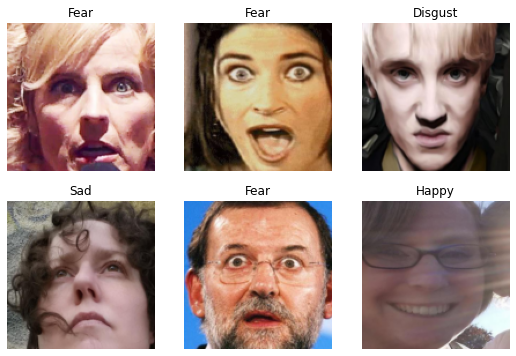

In [ ]:
a = dls.train.show_batch(max_n=6,nrows=2)
a

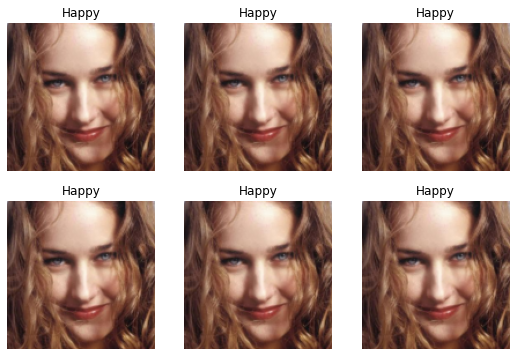

In [ ]:
a = dls.valid.show_batch(max_n=6,nrows=2,unique = True)

In [ ]:
learn = vision_learner(dls,resnet50,metrics=error_rate)
learn.fine_tune(1)


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:136: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and will be removed in 0.15. Please use keyword parameter(s) instead.
  f"Using {sequence_to_str(tuple(keyword_only_kwargs.keys()), separate_last='and ')} as positional "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.706608,1.401227,0.563025,04:25


epoch,train_loss,valid_loss,error_rate,time
0,1.075628,0.978011,0.382073,05:30


**confusion matrix**

usefull only in classification model  

show us what errors are we making

diagonal shows the correctly classified and off-diagonals are incorrectly classified
## ClassificationInterpretation class to plot confusion matrix and top_losses

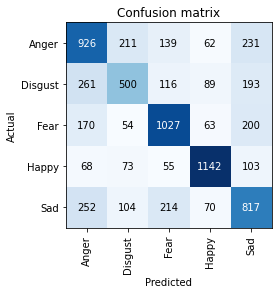

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
#before cleaning

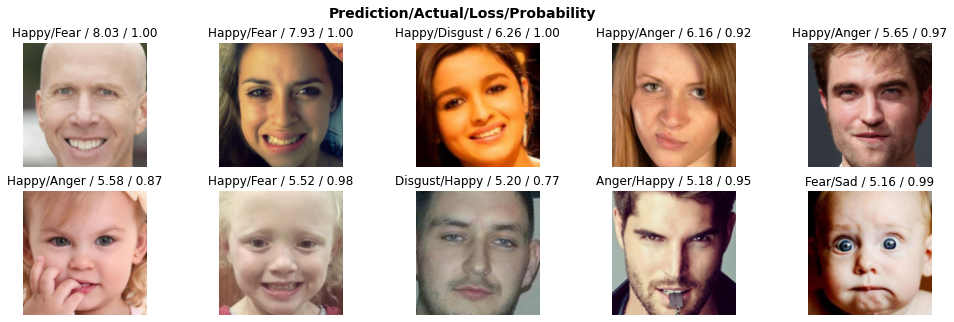

In [ ]:
interp.plot_top_losses(10,nrows=2,figsize=(17,5))

it tells the places where loss is very high
a loss will be bad when we predict wrongly and we very confident about that prediction or being right and unconfident

## ImageClassifierCleaner
this class to delete or change the data in that is in top_loss
to cleanup wrongly labeled in our data set

when we use this it actually runs our model thats why we pass learner into it

In [ ]:
from fastai.vision.widgets import *

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete():  cleaner.fns[idx].unlink()
   

In [ ]:
import timm

In [ ]:
!pip install timm


In [ ]:
x = timm.list_models('convnext_tiny_in22k')
x[0]

'convnext_tiny_in22k'

In [ ]:
scen = scen.new(item_tfms=RandomResizedCrop(224,min_scale=0.5))
dls = scen.dataloaders(train_path)
learn = vision_learner(dls,'convnext_tiny_in22k',metrics=error_rate)

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
#after cleaning

In [ ]:
learn.export('before_clean.pkl')

## MAKIG A WE APP WITH GRADIO AND PAPERSPACE

In [ ]:
!pip install gradio

In [ ]:
labels = learn.dls.vocab
def predict(img):
    img = PILImage.create(img)
    pred,pred_idx,probs = learn.predict(img)
    return {labels[i]: float(probs[i]) for i in range(len(labels))}

In [ ]:
import gradio as gr
gr.Interface(fn=predict, inputs=gr.inputs.Image(shape=(512, 512)), outputs=gr.outputs.Label(num_top_classes=3)).launch(share=True)

In [ ]:
learn.export()